In [99]:
import cv2
from matplotlib import pyplot as plt
import numpy as np
from pathlib import Path
import requests
import shutil
import os
from copy import deepcopy
from itertools import count

DATA_PATH = Path('./resources') 

def download_images(dir):
    os.makedirs(dir, exist_ok=True)
    urls = (
        "https://home.agh.edu.pl/~ggolasz/lab5_1.jpg",
        "https://home.agh.edu.pl/~ggolasz/lab5_2.png",
        "https://home.agh.edu.pl/~ggolasz/vid1.mov",
        "https://home.agh.edu.pl/~ggolasz/vid2.mov",
    )
    for url in urls:
        filename = url.split('/')[-1]
        if not filename in os.listdir(dir):
            res = requests.get(url, stream = True)
            if res.status_code == 200:
                with open(dir/filename,'wb') as f:
                    shutil.copyfileobj(res.raw, f)
                print('Image sucessfully Downloaded: ',filename)
            else:
                print('Image Couldn\'t be retrieved')

download_images(DATA_PATH)
            

def imshow(im, figsize=[20,10]):
    rcParams_bckp = plt.rcParams['figure.figsize']
    plt.rcParams['figure.figsize'] = figsize
    plt.imshow(cv2.cvtColor(im,cv2.COLOR_BGR2RGB))
    plt.rcParams['figure.figsize'] = rcParams_bckp

# Lab 5

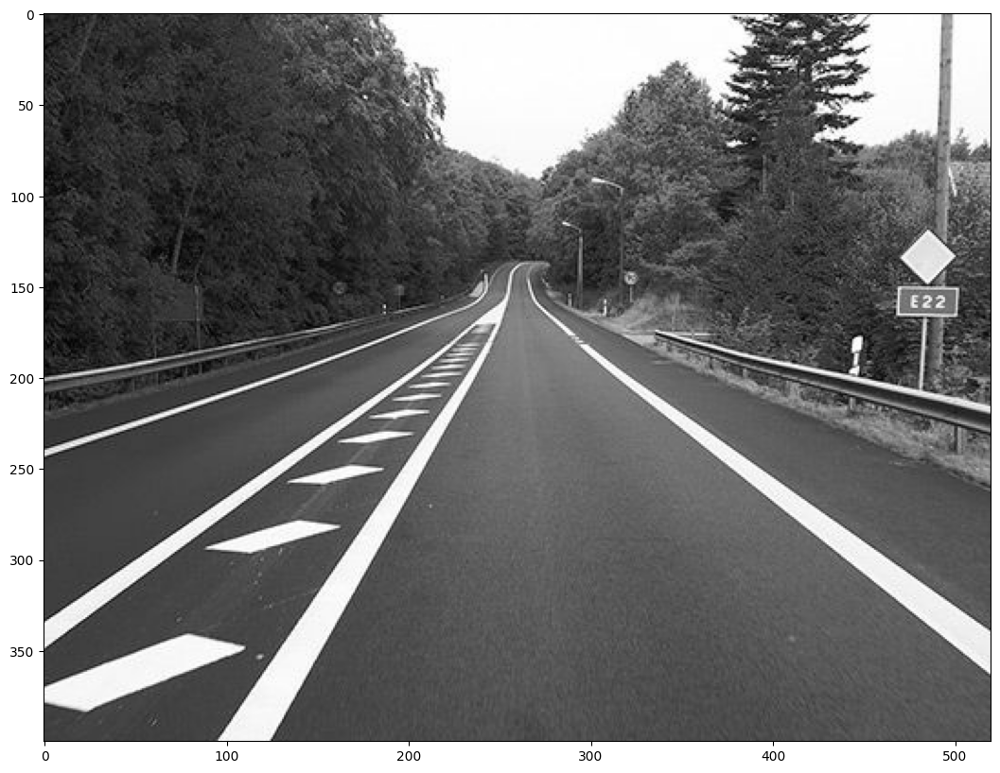

In [60]:
im = cv2.cvtColor(cv2.imread(str(DATA_PATH / 'lab5_1.jpg')), cv2.COLOR_BGR2GRAY)
imshow(im)

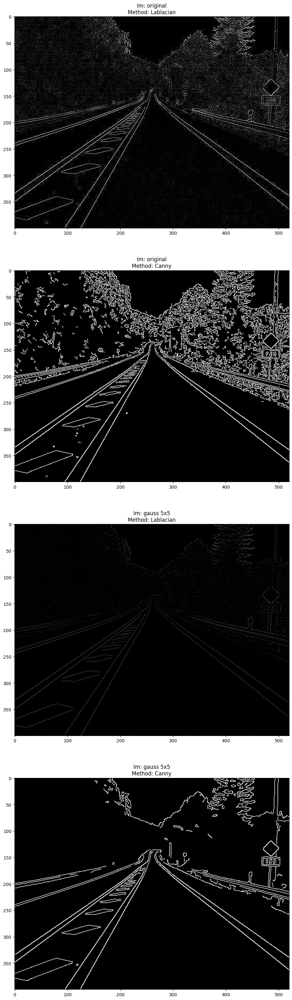

In [61]:
i=1
plt.rcParams['figure.figsize'] = [20, 40]
for im_label, curr_im in (('original', im), ('gauss 5x5', cv2.GaussianBlur(im, (5,5), 0))):
    for method, edge_im in (('Lablacian', cv2.Laplacian(curr_im, cv2.CV_8U)), ('Canny', cv2.Canny(curr_im, 100, 200))):
        plt.subplot(4,1,i)
        plt.title(f'Im: {im_label}\nMethod: {method}')
        imshow(edge_im)
        i+=1
plt.rcParams['figure.figsize'] = [20, 10]

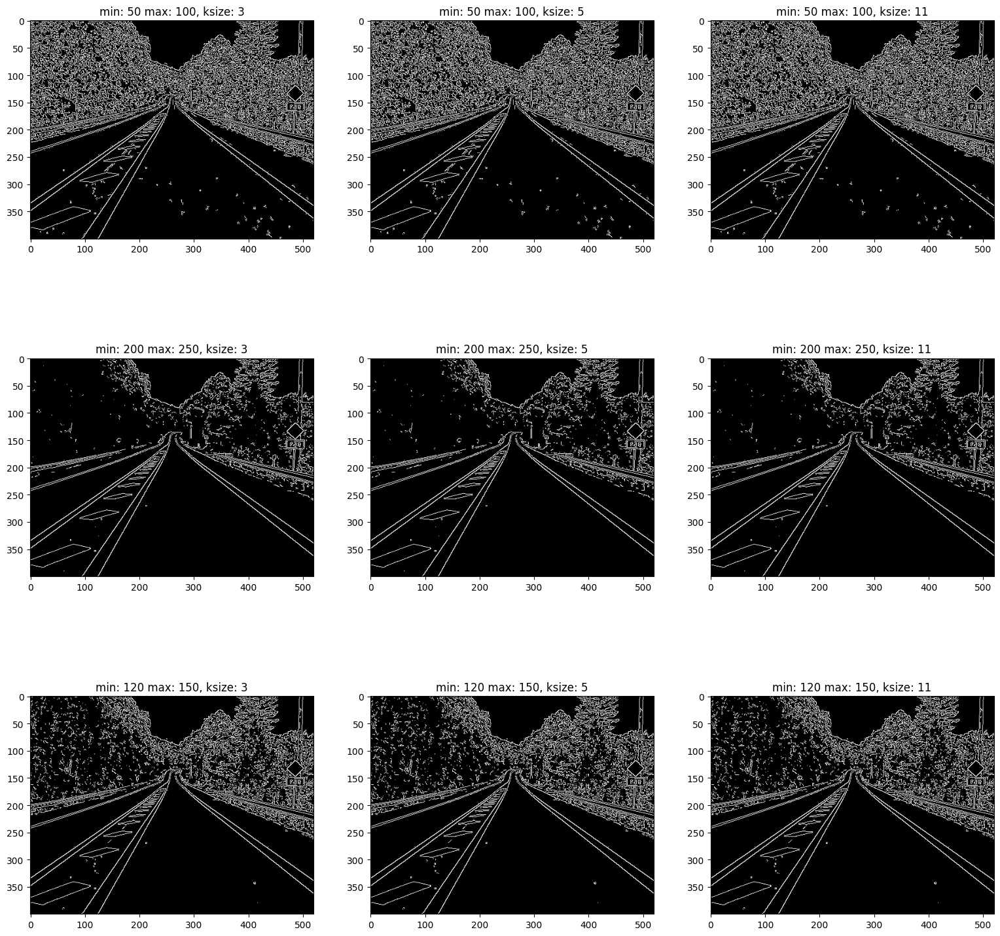

In [63]:
min_max_set = [
    (50, 100),
    (200, 250),
    (120, 150),
]
ksize_set = [3,5,11]
i=1
plt.rcParams['figure.figsize'] = [19, 19]
for min_, max_ in min_max_set:
    for ksize in ksize_set:
        plt.subplot(3,3,i)
        plt.title(f'min: {min_} max: {max_}, ksize: {ksize}')
        imshow(cv2.Canny(im, min_, max_, ksize))
        i+=1
plt.rcParams['figure.figsize'] = [20, 10]

(10, 1, 2)


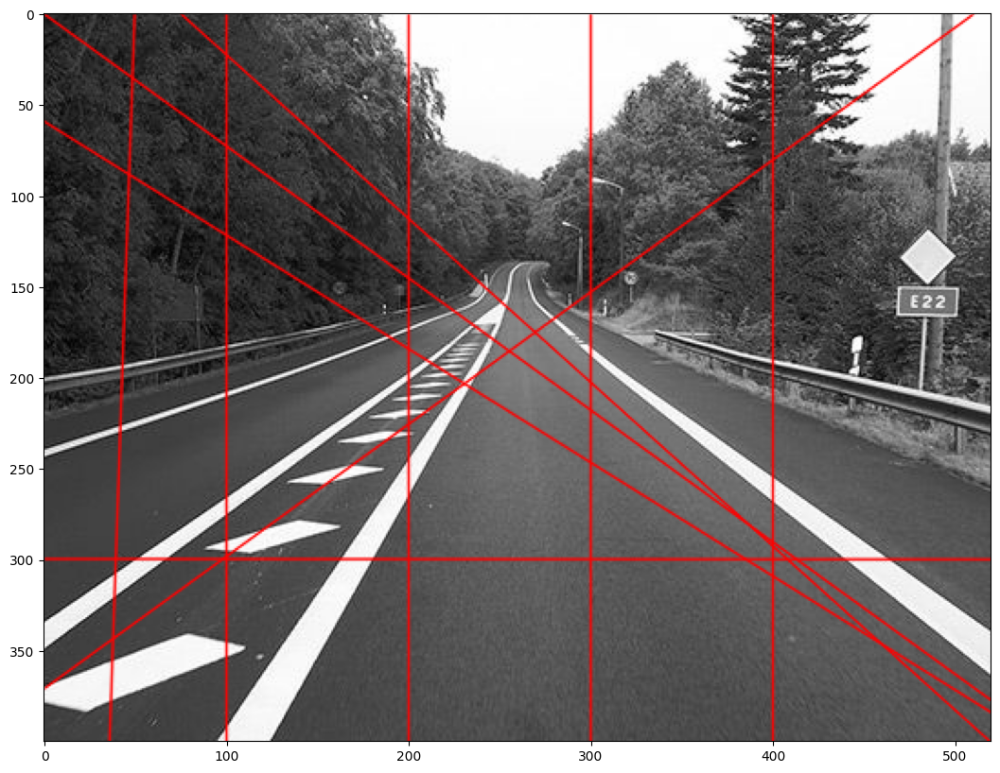

In [64]:
cp_im = cv2.cvtColor(np.copy(im),  cv2.COLOR_GRAY2BGR)
lines = cv2.HoughLines(im, 50, np.pi/90, 1)
print(lines.shape)
for line in lines:
    line = line[0]
    rho, theta = line[0], line[1]
    a, b = np.cos(theta), np.sin(theta)
    x0, y0 = a * rho, b * rho
    pt1 = (int(x0 + 1000*(-b)), int(y0 + 1000*(a)))
    pt2 = (int(x0 - 1000*(-b)), int(y0 - 1000*(a)))
    cv2.line(cp_im, pt1, pt2, (0,0,255), 1, cv2.LINE_AA)
imshow(cp_im)

In [65]:
im = cv2.imread(str(DATA_PATH / 'lab5_2.png'))
cp_im = cv2.cvtColor(np.copy(im),  cv2.COLOR_BGR2GRAY)
cp_im = cv2.GaussianBlur(cp_im, (5,5), 0)
circles = cv2.HoughCircles(cp_im, cv2.HOUGH_GRADIENT, 1, 100, param1=1, param2=100, minRadius=100, maxRadius=400)
circles = circles.astype(np.uint8)
print(circles)
for circle in circles[0]:
    cv2.circle(im, circle[:2], circle[2], (0,0,255), 3)
imshow(im)

KeyboardInterrupt: ignored

# Lab 7

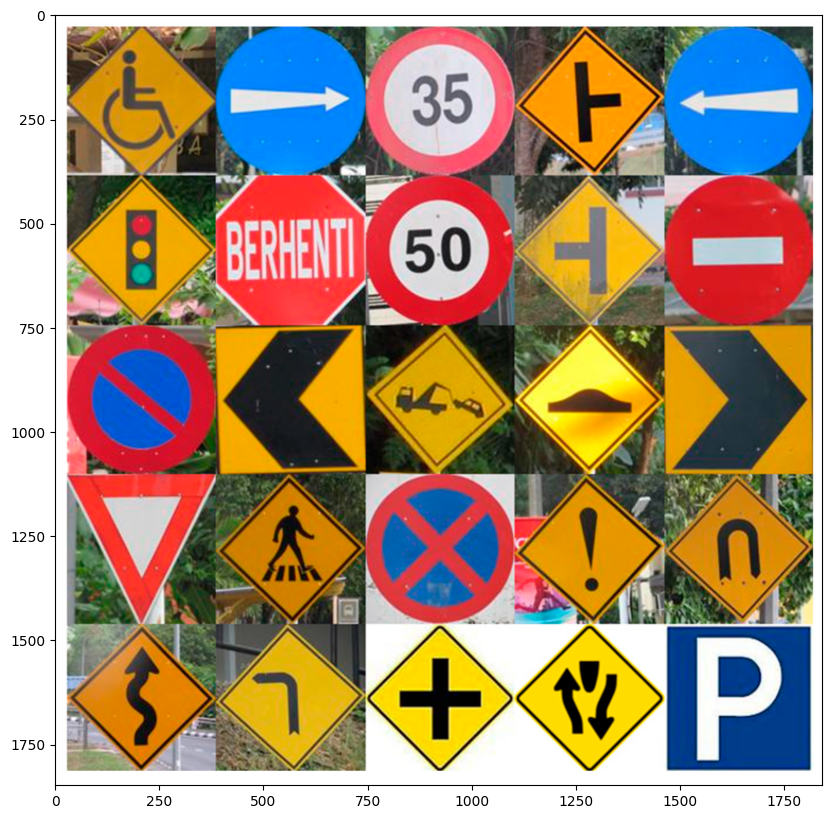

In [13]:
im = cv2.imread(str(DATA_PATH / 'lab5_2.png'))
imshow(im)

In [17]:
im_bw = cv2.cvtColor(im,cv2.COLOR_BGR2GRAY)

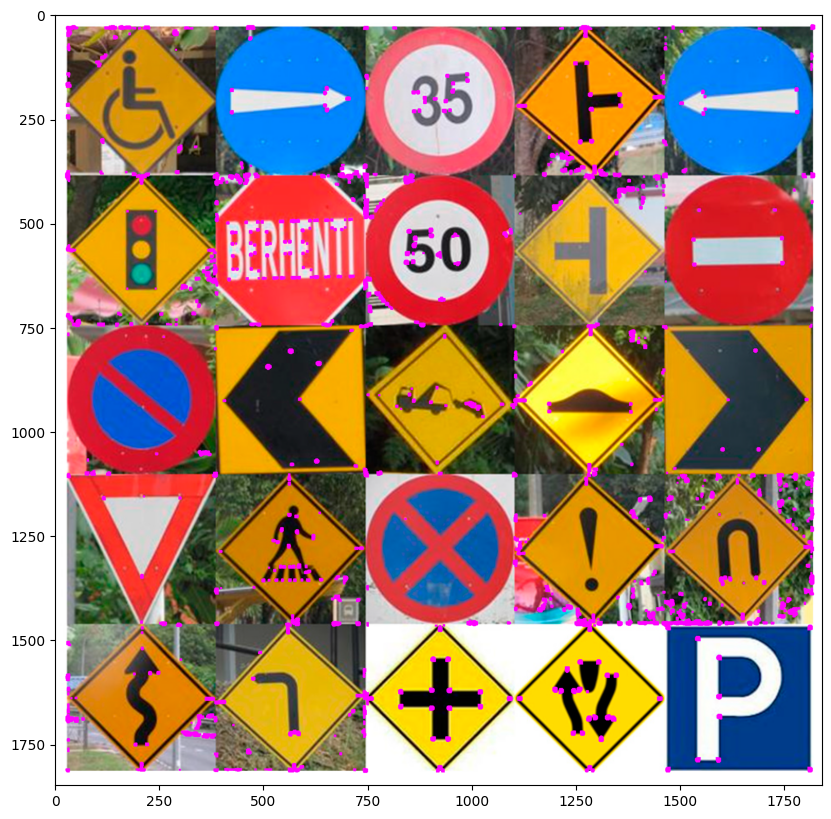

In [41]:
ch = cv2.cornerHarris(im_bw,8,5,0.04)
ch = cv2.dilate(ch,None)
ch = cv2.dilate(ch,None)
im_tmp = deepcopy(im)
im_tmp[ch>0.01*ch.max()] = [255,0,255]
imshow(im_tmp)

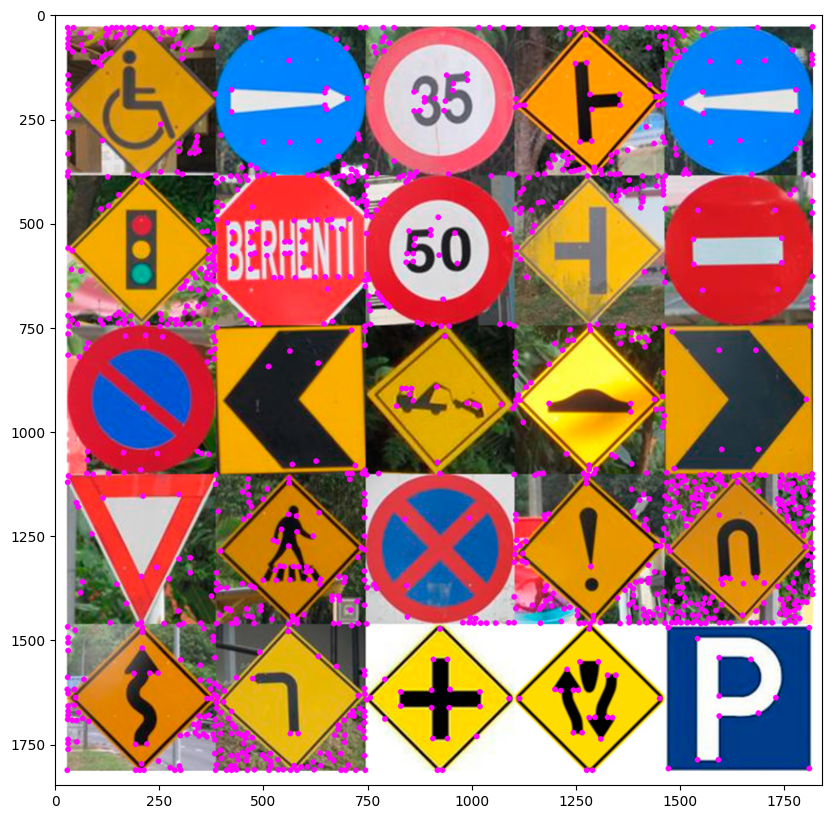

In [76]:
gftt = cv2.goodFeaturesToTrack(im_bw,100000,0.03,10)
gftt = np.uint64(gftt)
im_tmp = deepcopy(im)
for i in gftt:
    x,y = i.ravel()
    cv2.circle(im_tmp,(x,y),7,[255,0,255],-1)
imshow(im_tmp)

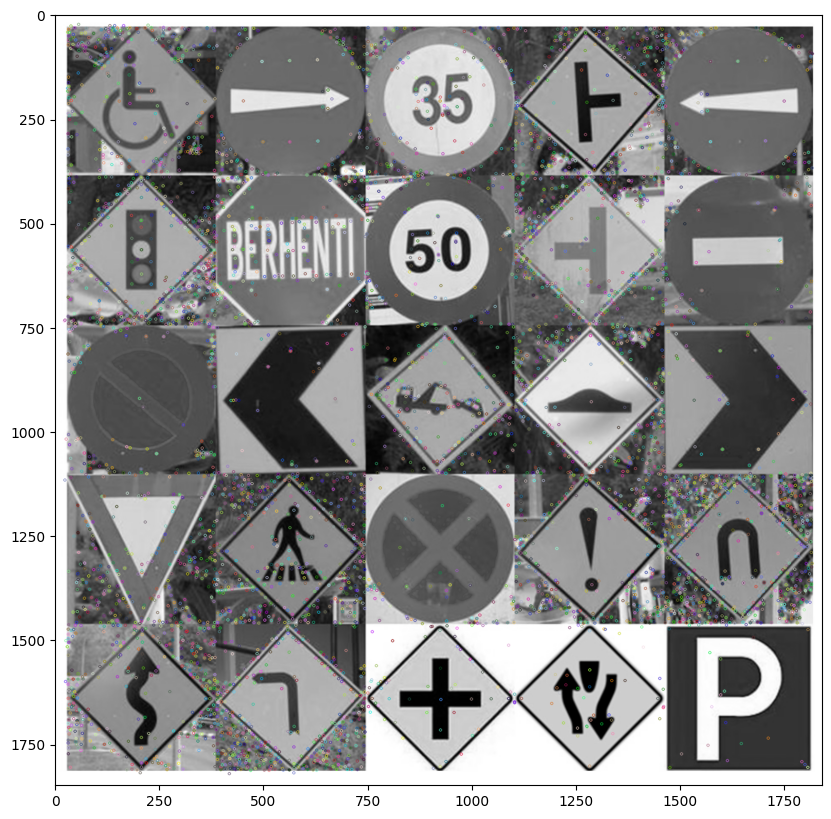

In [79]:
sift = cv2.SIFT_create()
kp = sift.detect(im_bw,None)
im_tmp = deepcopy(im)
im_tmp=cv2.drawKeypoints(im_bw,kp,im_tmp)
imshow(im_tmp)

In [80]:
# surf = cv2.xfeatures2d.SURF_create(400)
# kp, des = surf.detectAndCompute(img,None)
# im_tmp = deepcopy(im)
# im_tmp = cv.drawKeypoints(im_tmp,kp,None,(255,0,0),4)
# imshow(im_tmp)

error: OpenCV(4.8.0) D:\a\opencv-python\opencv-python\opencv_contrib\modules\xfeatures2d\src\surf.cpp:1028: error: (-213:The function/feature is not implemented) This algorithm is patented and is excluded in this configuration; Set OPENCV_ENABLE_NONFREE CMake option and rebuild the library in function 'cv::xfeatures2d::SURF::create'


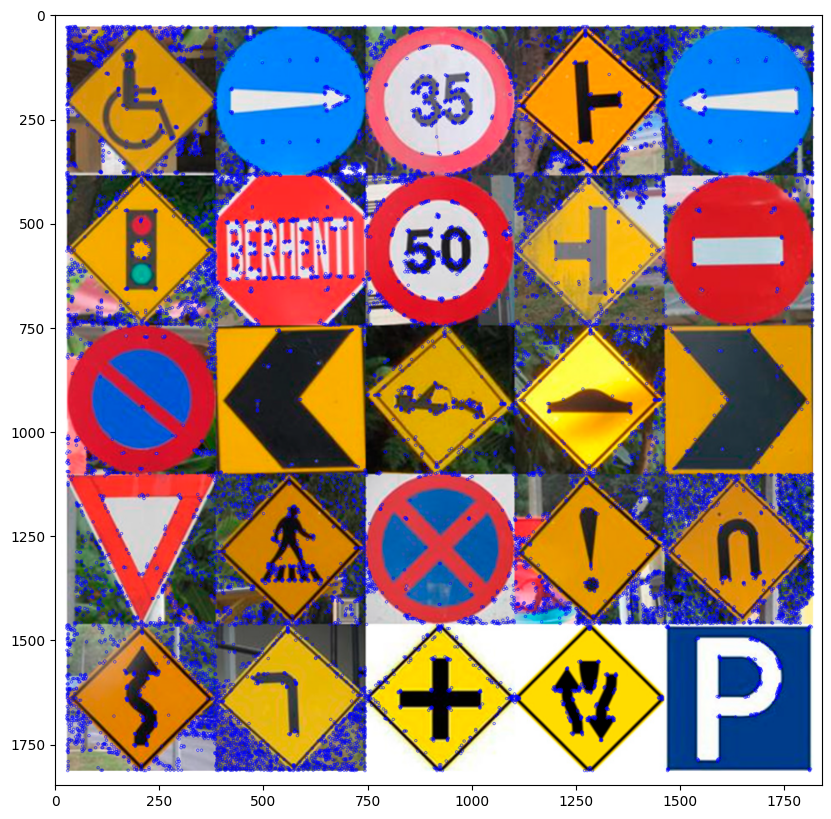

In [84]:
fast = cv2.FastFeatureDetector_create()
kp = fast.detect(im,None)
im_tmp = deepcopy(im)
im_tmp = cv2.drawKeypoints(im_tmp, kp, None, color=(255,0,0))
imshow(im_tmp)

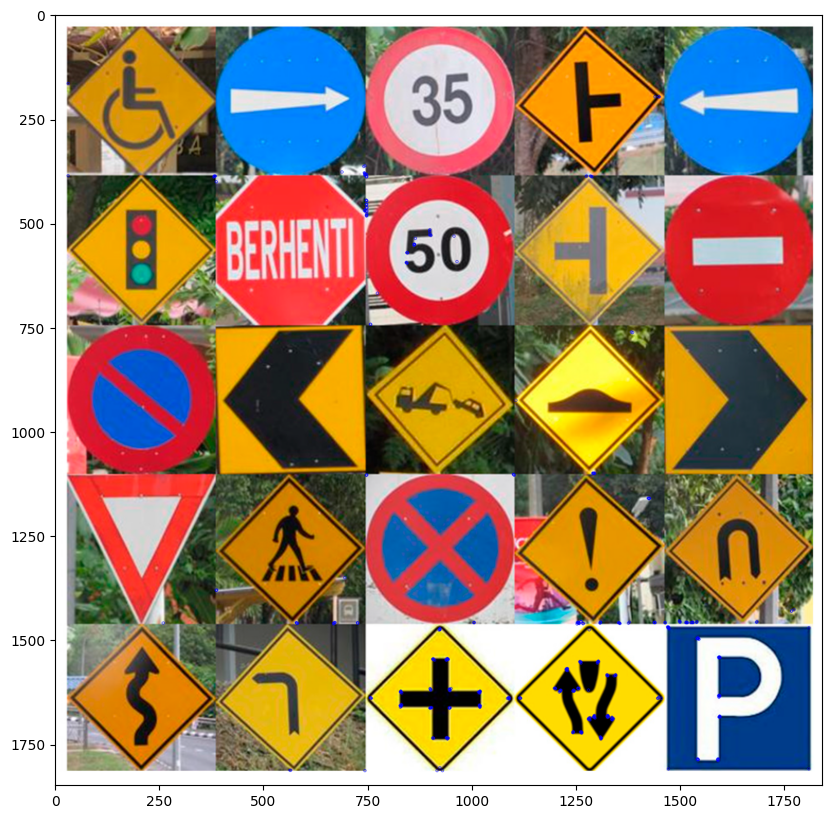

In [86]:
orb = cv2.ORB_create()
kp = orb.detect(im,None)
kp, des = orb.compute(im, kp)
im_tmp = deepcopy(im)
im_tmp = cv2.drawKeypoints(im_tmp, kp, None, color=(255,0,0))
imshow(im_tmp)

In [108]:
cc = cv2.CascadeClassifier(str(DATA_PATH / 'haarcascade_frontalface_default.xml'))
vid_obj = cv2.VideoCapture(str(DATA_PATH / 'classroom.mp4'))
fourcc = cv2.VideoWriter_fourcc(*'MP4V')
r, f = vid_obj.read()
output_vid = cv2.VideoWriter('outputs/output.mp4', fourcc, 20.0, list(reversed(f.shape[:2])))
for i in count(1):
    if not r:
        break
    fbw = cv2.cvtColor(f,cv2.COLOR_BGR2GRAY)
    rects = cc.detectMultiScale(fbw, 1.1, 4)
    for rect in rects:
        cv2.rectangle(f, rect[:2], np.array(rect[:2])+np.array(rect[2:]), [0,0,255])
    output_vid.write(f)
    r, f = vid_obj.read()
output_vid.release()

10
20
30
40
50
60
70
80
90
100
110
120
130
140
150
160
170
180
190
200
210
220
230
240
250
260
270
280
290
300
310
320
330
340
350
360
370
380
390
400
410
420
430
440
450
460
470
480
490
500
510
520
530
540
550
560
570
580
590
600
610
620
630
640
650
660
670
680
690
700
710
720
730
740
750
760
770
780
790
800
810
820
830
840
850
860
870
880
890
900
910
920
930
940
950
960
970
980
